In [25]:
# %pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# %pip install opencv-python

In [4]:
# Imports
import tensorflow as tf
import os
import cv2
import imghdr
import matplotlib.pyplot as plt
import numpy as np
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

/Users/daisy./Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [8]:
data_dir = '/Users/daisy./Documents/info 492/data'

In [ ]:
# os.listdir(os.path.join(data_dir, 'fake'))

In [9]:
image_exts = ['jpeg', 'jpg', 'bmp', 'png']

In [11]:
# Cleaning data
for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))
                

Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-03-18_19-35-41_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-03-09_02-22-11_UTC.json.xz
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-03-18_19-35-41_UTC.json.xz
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-01-15_15-00-22_UTC.json.xz
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-01-17_15-00-01_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-01-13_15-00-09_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-03-15_15-15-37_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2023-12-27_15-01-42_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-03-03_00-00-15_UTC.txt
Image not in ext list /Users/daisy./Documents/info 492/data/arianagrande/2024-0

In [13]:
# for image_class in os.listdir(data_dir):
#     class_path = os.path.join(data_dir, image_class)
#     if os.path.isdir(class_path):  # Check if it's a directory
#         for image in os.listdir(class_path):
#             if image == '.DS_Store':  # Skip .DS_Store files
#                 continue
#         image_path = os.path.join(data_dir, image_class, image)
#         try:
#             img = cv2.imread(image_path)
#             tip = imghdr.what(image_path)
#             if tip not in image_exts:
#                 print('Image not in ext list {}'.format(image_path))
#                 os.remove(image_path)
#         except Exception as e:
#             print('Issue with image {}'.format(image_path))

In [9]:
# Documentation 
# tf.data.Dataset??

# tf.data.Dataset.list_files

data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 40 files belonging to 2 classes.


In [10]:
data_iterator = data.as_numpy_iterator()

In [11]:
# Get another batch
# Class 0 = fake
# Class 1 = real
batch = data_iterator.next()

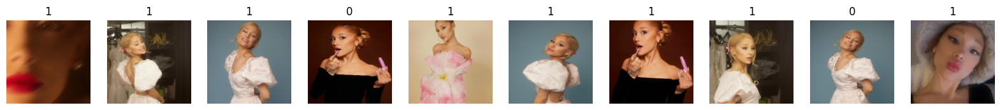

In [12]:
fig, ax = plt.subplots(ncols=10, figsize=(20,20))
for idx, img in enumerate(batch[0][:10]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])
    ax[idx].axis('off')

In [13]:
data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 40 files belonging to 2 classes.


In [14]:
# Scaling data
data = data.map(lambda x, y: (x/255, y))

In [15]:
iterator = data.as_numpy_iterator()

In [16]:
batch = iterator.next()

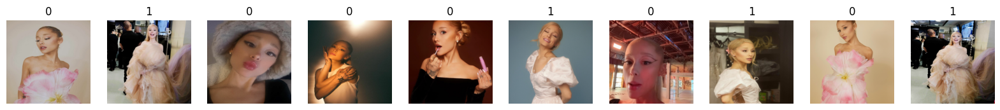

In [17]:
fig, ax = plt.subplots(ncols=10, figsize=(20,20))
for idx, img in enumerate(batch[0][:10]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])
    ax[idx].axis('off')

In [18]:
train_size = int(len(data)* .7)
val_size = int(len(data)* .2) + 1
test_size = int(len(data)* .1) + 1

In [19]:
train_size+val_size+test_size

3

In [20]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [24]:
model = Sequential()

In [26]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

/Users/daisy./Library/Python/3.9/lib/python/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [37]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

NameError: name 'weights' is not defined

In [39]:
weights = model.get_weights()
model.set_weights(weights)

In [28]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 14400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,686,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,696,625 (14.10 MB)

 Trainable params: 3,696,625 (14.10 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
logdir = '/Users/daisy./Documents/info 492/logs'

In [30]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [31]:
hist = model.fit(train, epochs=20, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.4688 - loss: 0.6947 - val_accuracy: 0.3750 - val_loss: 2.5738
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step - accuracy: 0.5312 - loss: 2.3899 - val_accuracy: 0.6250 - val_loss: 0.7145
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step - accuracy: 0.4688 - loss: 0.7752 - val_accuracy: 0.6250 - val_loss: 0.7886
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step - accuracy: 0.4688 - loss: 1.0317 - val_accuracy: 0.6250 - val_loss: 0.7305
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step - accuracy: 0.4688 - loss: 0.8857 - val_accuracy: 0.6250 - val_loss: 0.6307
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step - accuracy: 0.4688 - loss: 0.7219 - val_accuracy: 0.2500 - val_loss: 0.7427
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step - accuracy: 0.5312 - loss: 0.6863 - val_accuracy: 0.3750 - val_loss: 0.7491
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step - accuracy: 0.5312 - loss: 0.6830 - val_accuracy: 0.3750 - val_loss: 0.

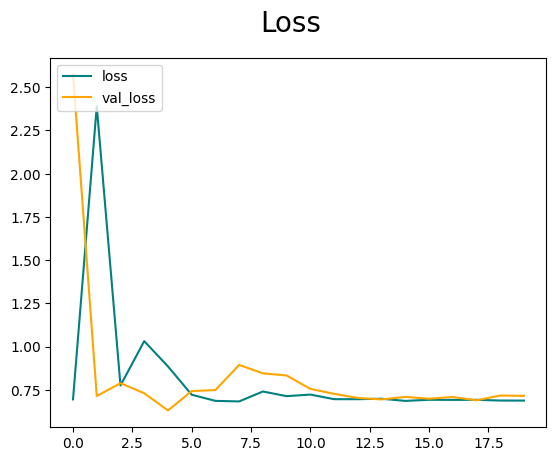

In [33]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

In [41]:
import os
import shutil
import random

# Set the source and destination directories
src_dir = '/Users/daisy./Documents/info 492/img_align_celeba/img_align_celeba'
dst_dir = '/Users/daisy./Documents/info 492/img_align_celeba'

# Create the destination folders
if not os.path.exists(dst_dir):
    os.makedirs(dst_dir)

# Get a list of all the image files in the source directory
image_files = [f for f in os.listdir(src_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Shuffle the list of image files
random.shuffle(image_files)

# Split the image files into 10 folders
num_folders = 100
num_images_per_folder = len(image_files) // num_folders

for i in range(num_folders):
    folder_name = f'folder_{i+1}'
    folder_path = os.path.join(dst_dir, folder_name)
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

    start = i * num_images_per_folder
    end = (i + 1) * num_images_per_folder
    for j, image_file in enumerate(image_files[start:end]):
        src_path = os.path.join(src_dir, image_file)
        dst_path = os.path.join(folder_path, image_file)
        shutil.copy(src_path, dst_path)
        print(f'Copied {image_file} to {folder_path}')

print('Done!')


Copied 149269.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 127536.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 022664.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 001755.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 098946.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 106342.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 093172.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 109288.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 193787.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 124252.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 198811.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 098244.jpg to /Users/daisy./Documents/info 492/img_align_celeba/folder_1
Copied 034267.jpg to /Users/daisy./Docum